# Things could be sped up by using Newton's 3rd law

In [1]:
import numpy as np
#import autograd.numpy as np
#from autograd import grad
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import plotly.graph_objects as go
import plotly.express as px
from scipy.integrate import solve_ivp
import time
from numba import njit


In [2]:
class Body:
    
    instances = []  ## All bodies are here
    body_count = 0
    positions = []  ## Not using this
    Masses = []

    def __init__(self, mass, position, velocity):
        
        self.mass = mass
        self.position = np.array(position)
        self.velocity = np.array(velocity)
        Body.positions.append(np.array(position)) 
        Body.Masses.append(mass) 
        Body.instances.append(self)  ## Saving body in list of all bodies
        Body.body_count +=1  ## Not using this

        
        #self.Potential_grad = grad(self.Potential) ## For numerical calculation of force from potential, not using

    @classmethod
    def preprocess(cls):
        """Convert lists to NumPy arrays for efficient computation."""
        cls.Masses = np.array(cls.Masses)
        cls.positions = np.array(cls.positions)

    
    def display(self):
        return (self.mass, self.position, self.velocity)
        

    @property
    def Kinetic(self):
        return np.dot(self.velocity, self.velocity) * 0.5 * self.mass
        

    def Potential(self, position): ##Only used for numerics!
        potential_energy = 0.0
        
        for other_body in Body.instances:
            if other_body is not self:  # Exclude the self-interaction term
                r = np.linalg.norm(position - other_body.position)  # Distance between the bodies
                potential_energy -= G * other_body.mass * self.mass / r
        
        return potential_energy
        

    @property 
    def Force_numerical(self):  ## For numerics
        return -self.Potential_grad(self.position)
        
    
    def acceleration(self):
        force = np.array([0.0, 0.0, 0.0])
        for other in Body.instances:
            if other is not self:
                r_vector = self.position - other.position
                r = np.linalg.norm(r_vector)
                force += -G * self.mass * other.mass * r_vector / r**3
        return force/self.mass


    def acceleration_mybe1(self, positions):
        """ Calculate acceleration due to gravitational force from all other bodies """
        # Vectorized calculation of forces from all bodies
        mask = ~(np.all(positions == self.position, axis=1))
        
        diff = positions[mask] - self.position
        
        diff_mass = Body.Masses[mask, np.newaxis] * diff  # Scale each vector by the corresponding mass

        distances = np.linalg.norm(diff, axis=1)  # Calculate distances between bodies
        
        acc = G  * (diff_mass.T / (distances**3 + eps))  # Gravitational force
        
        return np.sum(acc, axis=1)   # Total force divided by mass gives acceleration

    def acceleration_mybe2(self, positions):
        """ Calculate acceleration due to gravitational force from all other bodies """
        # Vectorized calculation of forces from all bodies
        diff = positions - self.position
        
        diff_mass = Body.Masses[:, np.newaxis] * diff  # Scale each vector by the corresponding mass
        
        distances = np.linalg.norm(diff, axis=1)  # Calculate distances between bodies
        
        acc = G  * (diff_mass.T / (distances**3 + eps))  # Gravitational force
        
        acc[:, Body.instances.index(self)] = 0  # Set self-interaction forces to 0

        
        return np.sum(acc, axis=1)   # Total force divided by mass gives acceleration


In [3]:
G=1.0
eps=1.e-10
r_e = 1
m_e = 1

Earth = Body(mass=m_e, position=[1.0, 0, 0], velocity=[0, 500, 0])
Mercury = Body(mass=0.055 * m_e, position=[0.39, 0, 0], velocity=[0, 875, 0])
Venus = Body(mass=0.815 * m_e, position=[0.72, 0, 0], velocity=[0, 622, 0])
Mars = Body(mass=0.107 * m_e, position=[1.52, 0, 0], velocity=[0, 407, 0])
Jupiter = Body(mass=318 * m_e, position=[5.2, 0, 0], velocity=[0, 223, 0])
Saturn = Body(mass=95.2 * m_e, position=[9.58, 0, 0], velocity=[0, 165, 0])
Uranus = Body(mass=14.5 * m_e, position=[19.2, 0, 0], velocity=[0, 115, 0])
Neptune = Body(mass=17.1 * m_e, position=[30.1, 0, 0], velocity=[0, 88, 0])
Sun = Body(mass = m_e * 300000, position = [0,0,0], velocity = [0,0,0])

Body.preprocess()
num_bodies = len(Body.instances)
masses = np.array(Body.Masses)
r_es = np.array([0, 2, 4])
v_es = np.array([1, 3, 5])


In [4]:
### Was used for odeint, much slower implementation
def func(y,t):
    # Update position and velocity of each body in the instances list
    idx = 0
    i = 0
    for body in Body.instances:  
        body.position = np.array([y[idx], y[idx+2], y[idx+4]])
        body.velocity = np.array([y[idx+1], y[idx+3], y[idx+5]])
        Body.positions[i] =  body.position
        idx += 6
        i += 1

    # Collect derivatives (velocity and acceleration) for all bodies
    dydt = [] ### It would be better and faser to use numpy array here
    
    for body in Body.instances:
        acceleration = body.acceleration_mybe2(Body.positions)  # Calculate acceleration due to other bodies
        # Append velocity and acceleration components
        dydt.append(body.velocity[0])
        dydt.append(acceleration[0])
        dydt.append(body.velocity[1])
        dydt.append(acceleration[1])
        dydt.append(body.velocity[2])
        dydt.append(acceleration[2])
    
    return dydt

In [5]:
initial_conditions = []
for body in Body.instances:
    initial_conditions.extend([body.position[0], body.velocity[0],
                               body.position[1], body.velocity[1],
                               body.position[2], body.velocity[2]])

initial_conditions = np.array(initial_conditions)

In [6]:
### For solvers that take t first and y second
### Sped up using Numba library
@njit
def fun2(t,y):
    num_bodies = len(masses)
    
    # Reshape y into a 2D array for easier manipulation
    y_reshaped = y.reshape((num_bodies, 6))  # Each row is [x, vx, y, vy, z, vz]
        
    # Extract positions and velocities
    positions = y_reshaped[:, r_es]  # Columns: x, y, z
    velocities = y_reshaped[:, v_es]  # Columns: vx, vy, vz
    
    # Pairwise differences in positions
    diff = positions[:, np.newaxis, :] - positions[np.newaxis, :, :]
    
    # Compute pairwise distances manually (Euclidean distance)
    distances = np.sqrt(np.sum(diff**2, axis=2)) + eps  # Adding epsilon to avoid division by zero
        
    # Mask self-interaction
    np.fill_diagonal(distances, np.inf)  # Avoid division by zero for self-interactions
        
    # Compute forces using the gravitational formula
    acceleration = -np.sum(G * masses[np.newaxis, :, np.newaxis] * diff / (distances[:, :, np.newaxis]**3), axis=1)
    
    # Create dydt array (velocity and acceleration components)
    dydt = np.zeros_like(y)
    dydt[0::6] = velocities[:, 0]  # dx/dt = velocity x-component
    dydt[1::6] = acceleration[:, 0]  # dv/dt = acceleration x-component
    dydt[2::6] = velocities[:, 1]  # dy/dt = velocity y-component
    dydt[3::6] = acceleration[:, 1]  # dv/dt = acceleration y-component
    dydt[4::6] = velocities[:, 2]  # dz/dt = velocity z-component
    dydt[5::6] = acceleration[:, 2]  # dv/dt = acceleration z-component

    return dydt

In [7]:
### For solvers that take t first and y second
### Not using Numba (for comparison)
#@njit
def fun1(t,y):
    
    # Reshape y into a 2D array for easier manipulation
    y_reshaped = y.reshape((num_bodies, 6))  # Each row is [x, vx, y, vy, z, vz]
        
    # Extract positions and velocities
    positions = y_reshaped[:, r_es]  # Columns: x, y, z
    velocities = y_reshaped[:, v_es]  # Columns: vx, vy, vz
    
    diff = positions[:, np.newaxis, :] - positions[np.newaxis, :, :]  # Pairwise differences
    distances = np.linalg.norm(diff, axis=2) + eps  # Pairwise distances (with eps to avoid division by 0)
        
    # Mask self-interaction
    np.fill_diagonal(distances, np.inf)  # Avoid division by zero for self-interactions
        
    # Compute forces
    acceleration = -np.sum(G * masses[np.newaxis, :, np.newaxis] * diff / (distances[:, :, np.newaxis]**3), axis=1)
    
        
    # Create dydt array (velocity and acceleration components)
    dydt = np.zeros_like(y)
    dydt[0::6] = velocities[:, 0]  # dx/dt = velocity x-component
    dydt[1::6] = acceleration[:, 0]  # dv/dt = acceleration x-component
    dydt[2::6] = velocities[:, 1]  # dy/dt = velocity y-component
    dydt[3::6] = acceleration[:, 1]  # dv/dt = acceleration y-component
    dydt[4::6] = velocities[:, 2]  # dz/dt = velocity z-component
    dydt[5::6] = acceleration[:, 2]  # dv/dt = acceleration z-component

    return dydt

In [25]:
### Slow implementation
start = time.perf_counter()
tmax = 1
steps = 10000

t = np.linspace(0, tmax, steps)

# Perform numerical integration
solution = odeint(func, initial_conditions, t)
#solution = solve_ivp(func, [0, tmax], initial_conditions, method='DOP853', t_eval=t)
end = time.perf_counter()
print(end - start)

106.96002629999998


In [14]:
### Without Numba

start = time.perf_counter()
tmax = 1
steps = 10000

t = np.linspace(0, tmax, steps)
# Perform numerical integration
solution = solve_ivp(fun1, [0, tmax], initial_conditions, method='DOP853', t_eval=t)
#solution = solve_ivp(func, [0, tmax], initial_conditions, method='DOP853', t_eval=t)
end = time.perf_counter()
print(end - start)

1.786463700000013


In [15]:
### Uses NUMBA (First time it is slower but on the second run it is faster because Numba has to prepare something on the first run)
start = time.perf_counter()
tmax = 1
steps = 10000
t = np.linspace(0, tmax, steps)
# Perform numerical integration
solution = solve_ivp(fun2, [0, tmax], initial_conditions, method='DOP853', t_eval=t, rtol=1e-6, atol=1e-9)
#solution = solve_ivp(func, [0, tmax], initial_conditions, method='DOP853', t_eval=t)
end = time.perf_counter()
print(end - start)

0.9185578999999962


In [16]:
Pos = np.empty([num_bodies * 3, steps])
Vel = np.empty([num_bodies * 3, steps])

for i in range(0,num_bodies * 6,2):

    Pos[int(i/2)] = solution.y[i]
    Vel[int(i/2)] = solution.y[i+1]


In [17]:
# for solve_ivp (has to be run after solve_ivp calculation because I was lazy to do it smartly)
def calculate_energy(Pos,Vel):
    
    energies = np.empty(steps)
    pos = np.empty([num_bodies*3,3])

    for i in range(steps):
        
        kinetic_i = 0
        # Extract current positions and velocities from the solution at time i
        idx = 0
        j = 0
        for body in Body.instances:
            
            vel = np.array([Vel[idx][i], Vel[idx+1][i], Vel[idx+2][i]])
            kinetic_i = kinetic_i + body.mass*np.dot(vel,vel)/2

            pos[j] = np.array([Pos[idx][i], Pos[idx+1][i], Pos[idx+2][i]])
            
            idx += 3
            j += 1

        # Calculate total kinetic energy
        

        # Calculate total potential energy
        potential_i = 0
        for j in range(num_bodies):
            for k in range(num_bodies):
                if j < k:  # Ensure each pair is counted only once
                    r_vector = pos[j] - pos[k]
                    r = np.linalg.norm(r_vector)
                    potential_i += -G * masses[j] * masses[k] / r

        
        # Total energy at time i
        total_energy = kinetic_i + potential_i
        energies[i] = total_energy

    return energies

# Example usage:
energies = calculate_energy(Pos,Vel)

In [18]:
energies

array([-12757762.36479455, -12757762.36501172, -12757762.36452813, ...,
       -12757767.56416117, -12757767.56492259, -12757767.56396607])

In [19]:
energies[len(energies)-1] - energies[0]

np.float64(-5.199171518906951)

(-12757662.36479455, -12757862.36479455)

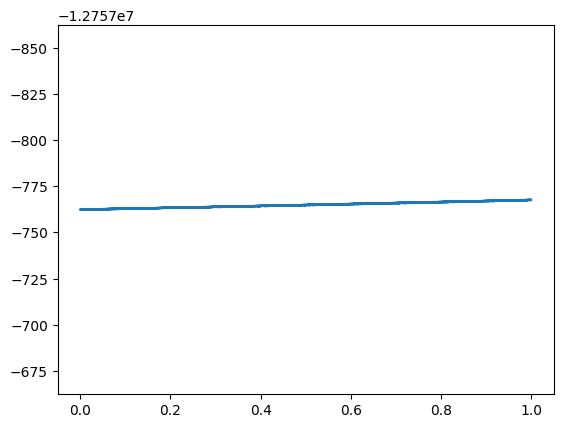

In [20]:
plt.plot(t,energies)
plt.ylim(energies[0]+100, energies[0]-100)

In [26]:
#for odeint (has to be run after odeint calculation)
def calculate_energy(solution):
    
    energies = []

    for i in range(len(solution)):
        # Extract current positions and velocities from the solution at time i
        idx = 0
        for body in Body.instances:
            body.position = np.array([solution[i][idx], solution[i][idx+2], solution[i][idx+4]])
            body.velocity = np.array([solution[i][idx+1], solution[i][idx+3], solution[i][idx+5]])
            idx += 6

        # Calculate total kinetic energy
        total_kinetic = sum(body.Kinetic for body in Body.instances)

        # Calculate total potential energy
        total_potential = 0
        for j, body1 in enumerate(Body.instances):
            for k, body2 in enumerate(Body.instances):
                if j < k:  # Ensure each pair is counted only once
                    r_vector = body1.position - body2.position
                    r = np.linalg.norm(r_vector)
                    total_potential += -G * body1.mass * body2.mass / r

        # Total energy at time i
        total_energy = total_kinetic + total_potential
        energies.append(total_energy)

    return energies

# Example usage:
energies = calculate_energy(solution)

In [27]:
energies[len(energies)-1] - energies[0]

np.float64(-10.72865665704012)

(-12757662.36479455, -12757862.36479455)

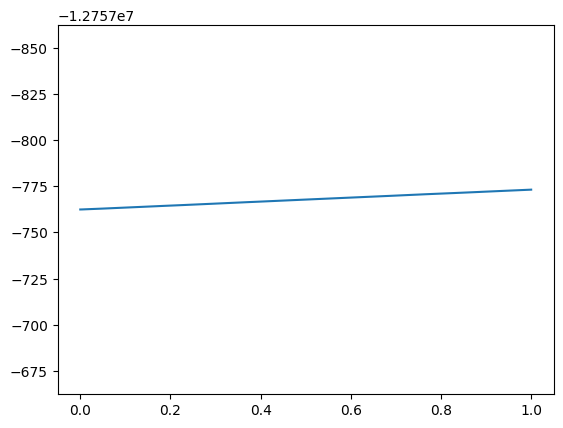

In [28]:
plt.plot(t,energies)
plt.ylim(energies[0]+100, energies[0]-100)

In [22]:
n_bodies = len(Body.instances)
body_solutions = {}
for i in range(n_bodies):
    body_solutions[f'body_{i+1}'] = {
        'x': solution.y[i*6],
        'vx': solution.y[i*6+1],
        'y': solution.y[i*6+2],
        'vy': solution.y[i*6+3],
        'z': solution.y[i*6+4],
        'vz': solution.y[:, i*6+5]
    }

C:\Users\Josip\AppData\Local\Temp\ipykernel_17560\2118983248.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color = plt.cm.get_cmap('tab10')(i % 10)  # Use 'tab10' colormap to cycle colors


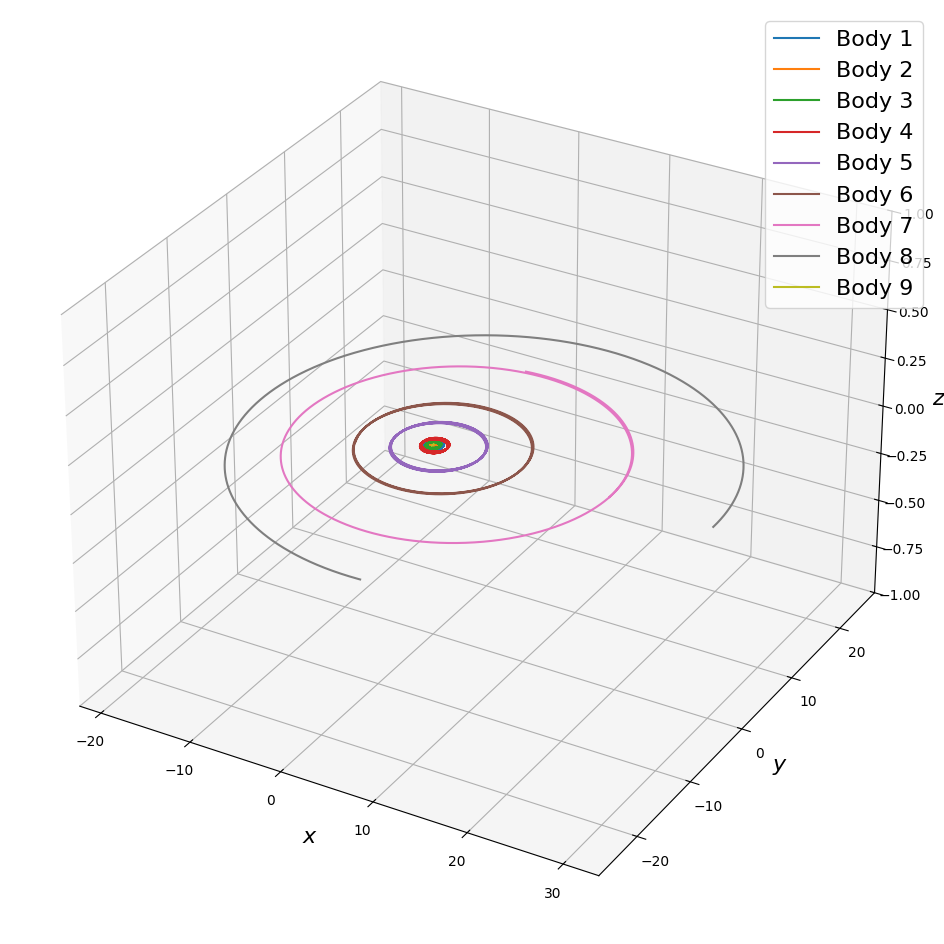

In [23]:
# Create the figure and 3D axis
fig10 = plt.figure(10, figsize=(12, 12))
ax = fig10.add_subplot(111, projection='3d')

# Loop through each body in the body_solutions dictionary and plot its trajectory
for i, body in enumerate(body_solutions.values()):
    x = body['x']
    y = body['y']
    z = body['z']
    
    # Use a different color for each body (can use a colormap or just a predefined set of colors)
    color = plt.cm.get_cmap('tab10')(i % 10)  # Use 'tab10' colormap to cycle colors
    
    # Plot the trajectory in 3D
    ax.plot3D(x, y, z, label=f'Body {i+1}', color=color)

# Set labels for the axes
ax.set_xlabel(r'$x$', fontsize=16)
ax.set_ylabel(r'$y$', fontsize=16)
ax.set_zlabel(r'$z$', fontsize=16)
ax.set_zlim(-1,1)
#ax.set_xlim(-1000,-600)
#ax.set_ylim(500,600)


# Add a legend
plt.legend(fontsize=16)

# Show the plot
plt.show()

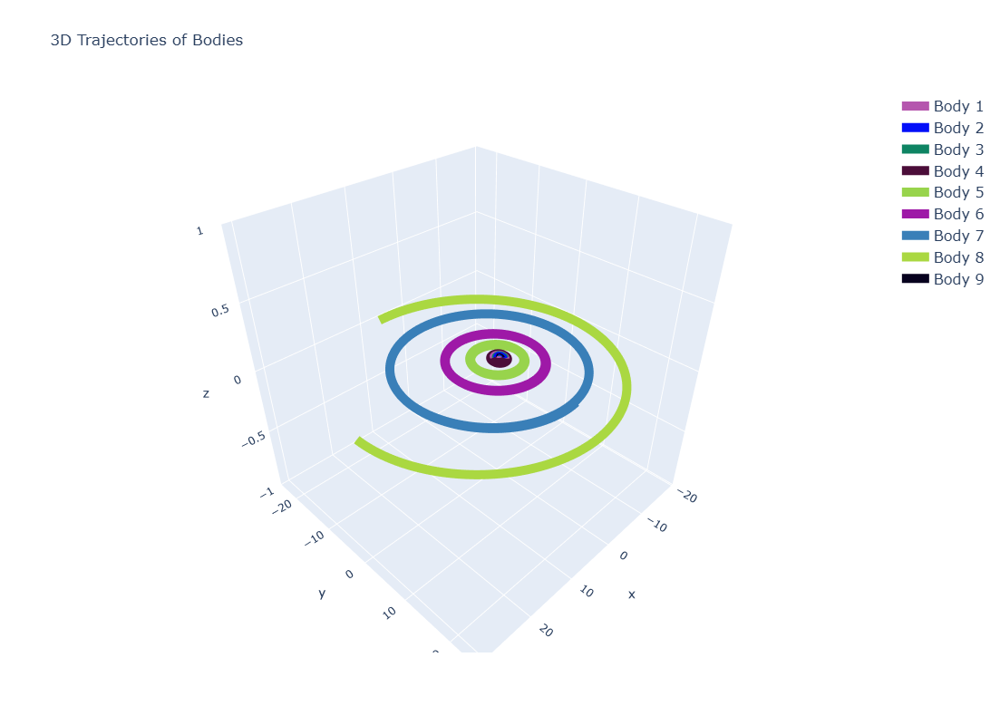

In [24]:
fig = go.Figure()

# Loop through each body in the dictionary and plot its trajectory
for i, (name, body) in enumerate(body_solutions.items()):
    x = body['x']
    y = body['y']
    z = body['z']
    
    # Use a colormap to pick a unique color for each body
    color = f'rgb({np.random.randint(0, 255)}, {np.random.randint(0, 255)}, {np.random.randint(0, 255)})'

    # Add a 3D scatter plot for the trajectory of each body
    fig.add_trace(go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='lines',
        name=f'Body {i+1}',
        line=dict(color=color, width=20)
    ))

# Set labels for the axes
fig.update_layout(
    scene=dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    ),
    legend=dict(font=dict(size=16)),
    title="3D Trajectories of Bodies",
    width=800,
    height=800
)

# Show the plot
fig.show()